<div style="text-align:center; font-size:40px; color:white; font-weight:bold; padding:10px; border-radius:10px;">
    Understanding Credit Card Fraud: An EDA Approach<br> 
    <span style="font-size:30px; font-weight:normal;">By Ahmed Reda</span>
</div>



<div style="text-align:center; font-size:50px; font-family: 'Courier New', monospace;  
            padding:20px; border-radius:10px; background-color:#ADD8E6; color:#000;">
    Dataset & Some Statistics
</div>




> **Note:** This analysis is subject to updates. The goal is to provide clear insights into the dataset and identify key patterns related to fraudulent transactions.

## Introduction  
This analysis explores the distribution and characteristics of credit card transactions from September 2013 by European cardholders. The dataset is highly imbalanced, with fraud accounting for only **0.172%** of all transactions. Due to privacy concerns, features are anonymized via PCA, except for `Time` and `Amount`.

## Objectives  
- **Understand Data Distribution:** Analyze the imbalance between fraud and non-fraud transactions.  
- **Feature Analysis:** Examine `Time`, `Amount`, and PCA-transformed features for patterns.  
- **Data Preprocessing:** Handle missing values, outliers, and feature scaling.  
- **Fraud Trends:** Identify common characteristics of fraudulent transactions.  
- **Visualization:** Use histograms, box plots, and correlation heatmaps to extract insights.  

## Key Findings  
- Fraudulent transactions tend to have **distinct patterns in `Amount` and `Time`**.  
- Some PCA-transformed features show stronger correlations with fraud.  
- **Data imbalance** must be addressed before model training.  




# Libraries

In [39]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import warnings
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib.patches as mpatches
import time
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
warnings.filterwarnings('ignore')


In [3]:
df = pd.read_csv(r'D:\Course Mostafa Saad\HomeWork & Projects\Projects\Credit Card Fraud Detection\Data\split\trainval.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,70320.0,-1.440536,-0.157661,1.951210,3.375675,1.076378,-1.049474,0.043954,0.063408,-1.379699,...,0.163049,0.035337,0.071452,0.710874,0.425002,0.353786,-0.007267,0.108108,62.38,0
1,36855.0,-0.268054,-0.026194,1.862894,-1.989876,-0.551961,-0.310759,0.277641,-0.160598,1.790869,...,0.201588,1.162627,-0.333368,0.171281,0.136557,-0.488836,0.063452,-0.095439,25.95,0
2,42436.0,-3.873686,2.279104,0.434901,-3.173945,-0.504830,0.029066,0.757593,-1.322265,2.122661,...,-0.771537,-1.354687,0.149311,-0.385015,-0.752701,0.449522,-3.542555,-1.439570,17.00,0
3,163977.0,-0.368752,0.922792,1.353228,2.461567,1.451856,2.942073,-0.074470,0.868245,-1.287337,...,0.445099,1.458492,-0.033405,-1.841053,-0.690577,0.123031,0.028285,0.027508,0.00,0
4,130811.0,2.258621,-1.431942,-0.567731,-1.431582,-1.627116,-0.924648,-1.228725,-0.224030,-1.030023,...,-0.137722,0.117330,0.253277,0.026271,-0.289235,-0.179701,0.024791,-0.042692,25.00,0


In [5]:
# Shape of DataSet
print(f"Number of column :{df.shape[1]}\nNumber of rows :{df.shape[0]}")

Number of column :31
Number of rows :56960


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56960 entries, 0 to 56959
Data columns (total 31 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    56960 non-null  float64
 1   V1      56960 non-null  float64
 2   V2      56960 non-null  float64
 3   V3      56960 non-null  float64
 4   V4      56960 non-null  float64
 5   V5      56960 non-null  float64
 6   V6      56960 non-null  float64
 7   V7      56960 non-null  float64
 8   V8      56960 non-null  float64
 9   V9      56960 non-null  float64
 10  V10     56960 non-null  float64
 11  V11     56960 non-null  float64
 12  V12     56960 non-null  float64
 13  V13     56960 non-null  float64
 14  V14     56960 non-null  float64
 15  V15     56960 non-null  float64
 16  V16     56960 non-null  float64
 17  V17     56960 non-null  float64
 18  V18     56960 non-null  float64
 19  V19     56960 non-null  float64
 20  V20     56960 non-null  float64
 21  V21     56960 non-null  float64
 22

 
The dataset consists of **56,960 transactions** with **31 features**, including `Time`, `Amount`, and 28 anonymized PCA-transformed variables (`V1` to `V28`). The target variable, `Class`, is binary, indicating whether a transaction is **fraudulent (`1`) or non-fraudulent (`0`)**. All features are numerical, with `Class` being the only integer type. The dataset has **no missing values** .


In [8]:
# Checking For Null Values
sum(df.isnull().sum())

0

In [10]:
# Checking For Duplicated Values
print(df.duplicated().sum())

62


 
The dataset contains **62 duplicate rows**, which may indicate repeated transactions or data entry errors. Duplicate values can **bias the analysis and model performance**, especially in fraud detection. These should be carefully examined and removed if necessary.  


In [12]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,56960.0,94618.777633,47567.353857,4.000000,53925.250000,84559.000000,139385.250000,172788.000000
V1,56960.0,0.008241,1.928594,-35.274010,-0.916434,0.026847,1.318466,2.418802
V2,56960.0,0.009452,1.610555,-44.639245,-0.600371,0.069277,0.811323,17.418649
V3,56960.0,0.004196,1.493492,-31.813586,-0.887902,0.184420,1.024113,4.101716
V4,56960.0,-0.001807,1.414919,-5.416315,-0.856074,-0.030007,0.747237,12.699542
V5,56960.0,0.003572,1.350720,-29.730600,-0.688001,-0.053001,0.614933,31.457046
V6,56960.0,-0.004865,1.325396,-21.248752,-0.773573,-0.283597,0.390776,21.307738
V7,56960.0,-0.007557,1.183066,-31.197329,-0.557624,0.037480,0.568802,31.527244
V8,56960.0,0.001075,1.205519,-50.943369,-0.208778,0.023736,0.331706,20.007208
V9,56960.0,0.003971,1.094351,-9.462573,-0.639260,-0.050270,0.602992,10.370658


 

- The **`Time`** feature ranges from **4 to 172,788 seconds**, indicating transactions span across nearly **two days**.  
- **PCA-transformed features (`V1` to `V28`)** have varying distributions, with some showing extreme minimum and maximum values, suggesting potential **outliers**.  
- **`Amount`** has a wide range (**$0 to $11,789.84**), with a median of **$21.88**, indicating most transactions are of lower amounts.  
- The **fraud class (`Class`) is highly imbalanced** with a mean of **0.00158 (0.158%)**, reinforcing the dataset's skewed nature.  
- Several features have **negative minimum values**, which could indicate the effect of **PCA transformation** rather than real monetary values.  


In [13]:
pd.DataFrame({
    'count':df.shape[0],
    'Nulls':df.isnull().sum(),
    'nulls%':df.isnull().sum()*100,
    'cardinality': df.nunique(),
})

,count,Nulls,nulls%,cardinality
Time,56960,0,0,46667
V1,56960,0,0,56253
V2,56960,0,0,56253
V3,56960,0,0,56253
V4,56960,0,0,56253
V5,56960,0,0,56253
V6,56960,0,0,56253
V7,56960,0,0,56253
V8,56960,0,0,56253
V9,56960,0,0,56253


<div style="text-align:center; font-size:50px; font-family: 'Courier New', monospace;  
            padding:20px; border-radius:10px; background-color:#ADD8E6; color:#000;">
    Analysis
</div>


# Feature Distribution

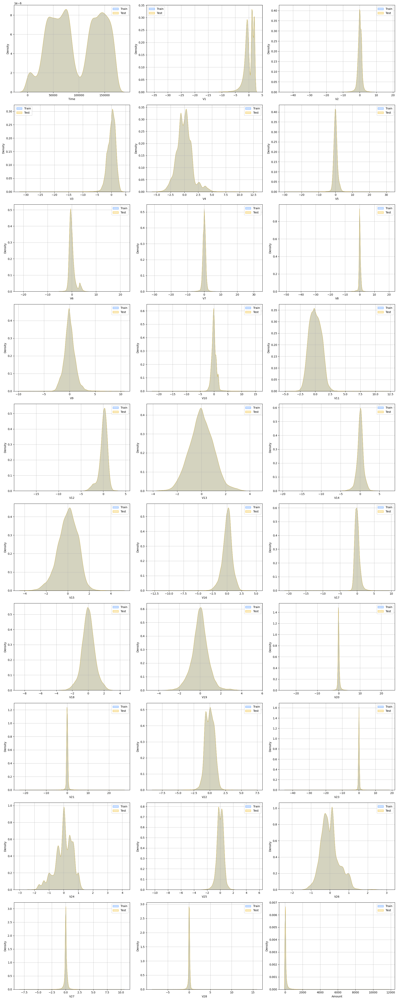

In [35]:
numeric_columns = (list(df.loc[:, 'Time':'Amount']))

fig = plt.figure(figsize=(20, 50))
rows, cols = 10, 3
for idx, num in enumerate(numeric_columns[:30]):
    ax = fig.add_subplot(rows, cols, idx+1)
    ax.grid(alpha = 0.7, axis ="both")
    sns.kdeplot(x = num, fill = True,color ="#3386FF",linewidth=0.6, data = df, label = "Train")
    sns.kdeplot(x = num, fill = True,color ="#EFB000",linewidth=0.6, data = df, label = "Test")      
    ax.set_xlabel(num)
    ax.legend()
fig.tight_layout()
fig.show()

In [ ]:
# The classes are heavily skewed we need to solve this issue later.
fraud_ratio = df['Class'].value_counts(normalize=True) * 100
print(f"No Frauds: {fraud_ratio[0]:.2f}% of the dataset")
print(f"Frauds: {fraud_ratio[1]:.2f}% of the dataset")


No Frauds: 99.84% of the dataset
Frauds: 0.16% of the dataset


Note: Notice how imbalanced is our original dataset! Most of the transactions are non-fraud. If we use this dataframe as the base for our predictive models and analysis we might get a lot of errors and our algorithms will probably overfit since it will "assume" that most transactions are not fraud. But we don't want our model to assume, we want our model to detect patterns that give signs of fraud!

In [25]:
print(df['Class'].value_counts())

Class
0    56870
1       90
Name: count, dtype: int64


In [24]:
colors = ["#0101DF", "#DF0101"]

# Create a DataFrame with class counts
class_counts = df['Class'].value_counts().reset_index()
class_counts.columns = ['Class', 'Count']  # Rename columns properly

# Create the bar plot
fig = px.bar(class_counts, 
             x='Class', y='Count', 
             color='Class', 
             color_discrete_sequence=colors, 
             labels={'Class': 'Class', 'Count': 'Frequency'},
             title='Class Distributions (0: No Fraud || 1: Fraud)')

fig.show()


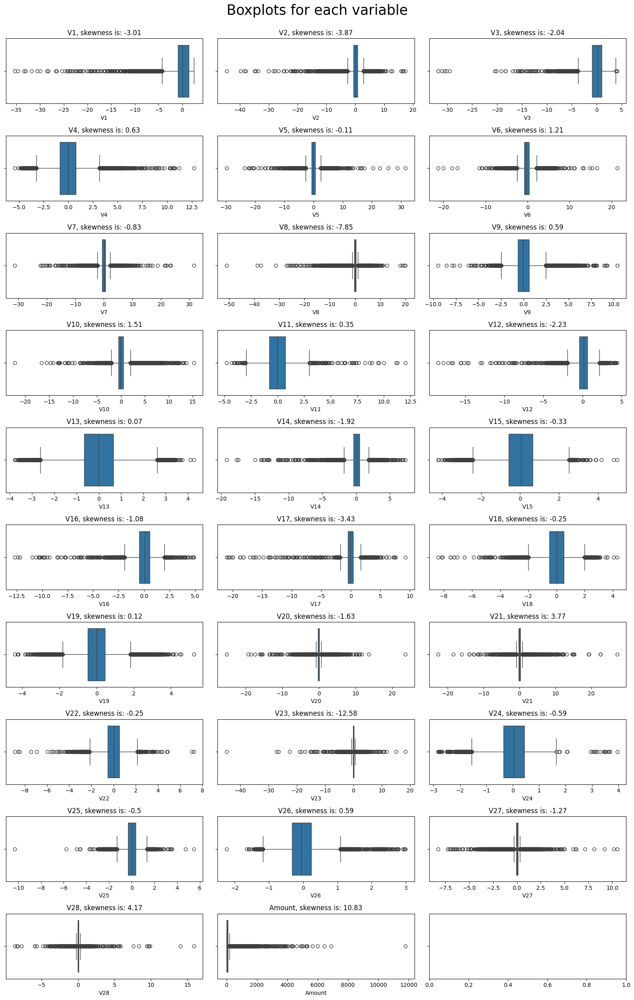

In [42]:
numeric_columns = (list(df.loc[:, 'V1':'Amount']))

# checking boxplots
def boxplots_custom(dataset, columns_list, rows, cols, suptitle):
    fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(16,25))
    fig.suptitle(suptitle,y=1, size=25)
    axs = axs.flatten()
    for i, data in enumerate(columns_list):
        sns.boxplot(data=dataset[data], orient='h', ax=axs[i])
        axs[i].set_title(data + ', skewness is: '+str(round(dataset[data].skew(axis = 0, skipna = True),2)))
        
boxplots_custom(dataset=df, columns_list=numeric_columns, rows=10, cols=3, suptitle='Boxplots for each variable')
plt.tight_layout()

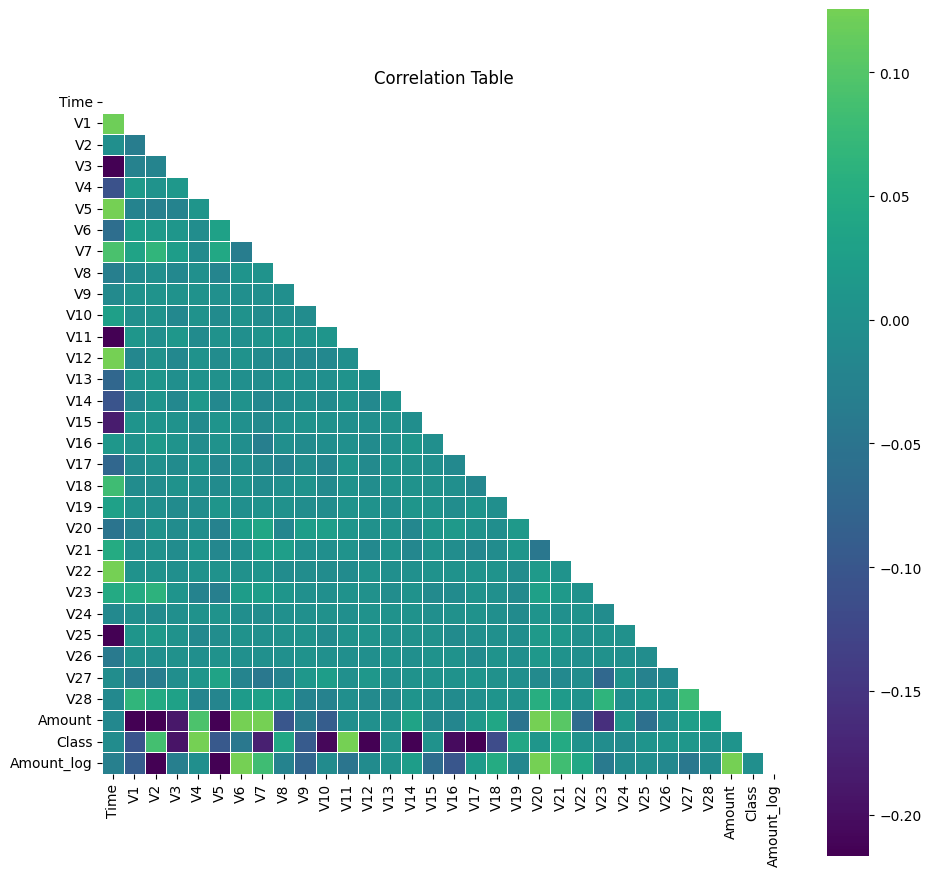

In [43]:
plt.figure(figsize = (11,11))
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask = mask, robust = True, center = 0,square = True, cmap="viridis",linewidths = .6)
plt.title('Correlation Table')
plt.show()

In [41]:
# Define colors
colors = ["#A6CEE3", "#1F78B4"]  # Light blue for NO Fraud, Dark blue for Fraud

# Compute class distribution
class_counts = df['Class'].value_counts()
labels = ["No Fraud", "Fraud"]
values = [class_counts[0], class_counts[1]]

# Create subplots with 1 row and 2 columns
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=["Fraud vs NO Fraud transactions (%)", "Fraud vs NO Fraud transactions (count)"],
    specs=[[{"type": "pie"}, {"type": "bar"}]]
)

# Pie Chart
fig.add_trace(
    go.Pie(
        labels=labels, 
        values=values, 
        textinfo="percent", 
        hole=0.4,  # Donut shape
        marker=dict(colors=colors),
        name="Fraud vs NO Fraud"
    ), 
    row=1, col=1
)

# Bar Chart
fig.add_trace(
    go.Bar(
        x=labels,
        y=values,
        text=values,  # Show values on bars
        textposition="auto",
        marker=dict(color=colors),
        name="Fraud vs NO Fraud"
    ), 
    row=1, col=2
)

# Fix layout issues
fig.update_layout(
    showlegend=True,
    title_text="Fraud vs NO Fraud Transactions",
    title_x=0.5,  # Center title
    height=500,  # Adjust height to avoid overlap
    width=900,   # Adjust width for better spacing
    margin=dict(t=50, b=50, l=50, r=50)  # Adjust margins
)

# Show the plot
fig.show()


In [27]:
fig = px.histogram(df, x='Amount', nbins=50, marginal='box', opacity=0.7, title="Distribution of Transaction Amount")
fig.update_layout(bargap=0.1)  # Adjust gap between bars
fig.show()

- The histogram displays the distribution of transaction amounts, showing a strong right skew due to a high frequency of small transactions.  
- A box plot above the histogram highlights the spread of transaction amounts, with numerous outliers at higher values.  
- The visualization helps detect anomalies and understand transaction patterns in the dataset.  
- we can apply log to overcome this proplem.

In [29]:
df['Amount_log'] = np.log1p(df['Amount'])

In [31]:
fig = px.histogram(df, x='Amount_log', nbins=50, marginal='box', opacity=0.7, title="Distribution of log-transformed Transaction Amount")
fig.update_layout(bargap=0.1)  # Adjust gap between bars
fig.show()


Applying a log transformation to the transaction amount reduces the impact of extreme values, making the distribution more symmetric.  
- Before transformation, the data was highly skewed to the right, with most transactions concentrated in the lower range.  
- After applying `log1p()`, the distribution becomes more balanced, improving interpretability and model performance.  
- The box plot also shows a reduction in extreme outliers, making the data more suitable for analysis.  


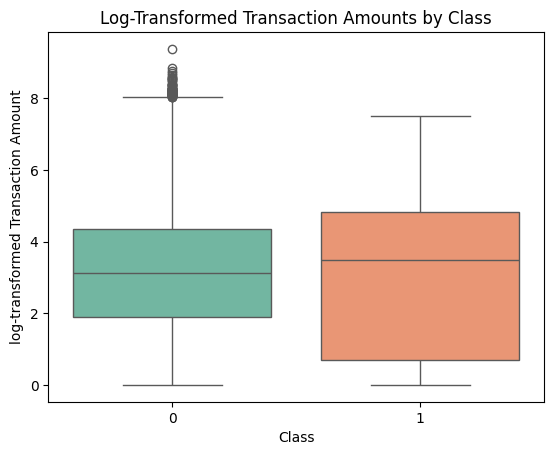

In [32]:
sns.boxplot(x='Class', y=np.log1p(df['Amount']), data=df, palette='Set2')
plt.title("Log-Transformed Transaction Amounts by Class")
plt.xlabel("Class")
plt.ylabel("log-transformed Transaction Amount")
plt.show()

In [28]:
fig = px.histogram(df, x='Time', nbins=50, marginal='box', opacity=0.7, title="Distribution of Transaction Time")
fig.update_layout(bargap=0.1)  # Adjust gap between bars
fig.show()

- The histogram shows the distribution of transaction times, with two peaks indicating different activity periods.  
- A box plot is included above the histogram, highlighting the spread, median, and potential outliers in the data.  
- The visualization helps identify patterns in transaction frequency over time.  


In [34]:
# Filter the data for Class 1
class_1_data = df[df['Class'] == 1]

# Plot the distribution of Time for Class 1
fig_1 = px.histogram(class_1_data, x='Time', nbins=50, marginal='box', opacity=0.7,
                     title="Distribution of Transaction Time for Class 1")
fig_1.update_layout(xaxis_title="Time", yaxis_title="Frequency")
fig_1.show()

# Filter the data for Class 0
class_0_data = df[df['Class'] == 0]

# Plot the distribution of Time for Class 0
fig_0 = px.histogram(class_0_data, x='Time', nbins=50, marginal='box', opacity=0.7,
                     title="Distribution of Transaction Time for Class 0")
fig_0.update_layout(xaxis_title="Time", yaxis_title="Frequency")
fig_0.show()


In [46]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

# Filter data for Class 0 and Class 1
class_0_data = df[df['Class'] == 0]
class_1_data = df[df['Class'] == 1]

# Create subplots (2 rows, 2 columns)
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        "Distribution of Transaction Amount for Class 0",
        "Log-Transformed Transaction Amount for Class 0",
        "Distribution of Transaction Amount for Class 1",
        "Log-Transformed Transaction Amount for Class 1"
    ]
)

# Scatter plot for Class 0 (Original)
fig.add_trace(
    go.Scatter(
        y=class_0_data['Amount'], mode='markers', marker=dict(color='blue', opacity=0.5),
        name="Class 0 - Original"
    ),
    row=1, col=1
)

# Scatter plot for Class 0 (Log-transformed)
fig.add_trace(
    go.Scatter(
        y=class_0_data['Amount_log'], mode='markers', marker=dict(color='red', opacity=0.5),
        name="Class 0 - Log"
    ),
    row=1, col=2
)

# Scatter plot for Class 1 (Original)
fig.add_trace(
    go.Scatter(
        y=class_1_data['Amount'], mode='markers', marker=dict(color='green', opacity=0.5),
        name="Class 1 - Original"
    ),
    row=2, col=1
)

# Scatter plot for Class 1 (Log-transformed)
fig.add_trace(
    go.Scatter(
        y=class_1_data['Amount_log'], mode='markers', marker=dict(color='orange', opacity=0.5),
        name="Class 1 - Log"
    ),
    row=2, col=2
)

# Update layout
fig.update_layout(
    title_text="Transaction Amount Distributions for Class 0 and 1",
    height=800, width=1000,  # Adjust size
    showlegend=False
)

# Show the plot
fig.show()
